In [14]:
#Loading the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_datareader as web
import scipy.optimize as sco
from arch import arch_model
from numpy import mean
import numpy as geek

# Data

In [7]:
# Getting stock data
companies = ['AMZN', 'AAPL', 'NFLX', 'GOOG']
#price_data = web.get_data_yahoo(companies,start = '2014-01-01', end = '2018-05-31')['Adj Close']
price_data = web.get_data_yahoo(companies,start = '2014-01-01', end = '2021-12-30')['Adj Close']
price_data

Symbols,AMZN,AAPL,NFLX,GOOG
Date,,,,
2014-01-02,397.970001,17.494316,51.831429,554.481689
2014-01-03,396.440002,17.110039,51.871429,550.436829
2014-01-06,393.630005,17.203344,51.367142,556.573853
2014-01-07,398.029999,17.080315,48.500000,567.303589
2014-01-08,401.920013,17.188478,48.712856,568.484192
...,...,...,...,...
2021-12-23,3421.370117,176.055695,614.090027,2942.850098
2021-12-27,3393.389893,180.100540,613.119995,2961.280029
2021-12-28,3413.219971,179.061859,610.710022,2928.959961


In [10]:
# Getting the log returns
log_ret = np.log(price_data/price_data.shift(1)).dropna(how='all') * 10
log_ret

Symbols,AMZN,AAPL,NFLX,GOOG
Date,,,,
2014-01-03,-0.038519,-0.222107,0.007715,-0.073216
2014-01-06,-0.071133,0.054385,-0.097694,0.110877
2014-01-07,0.111160,-0.071772,-0.574349,0.190947
2014-01-08,0.097257,0.063127,0.043792,0.020789
2014-01-09,-0.022667,-0.128522,-0.116218,-0.096766
...,...,...,...,...
2021-12-23,0.001842,0.036372,-0.002442,0.013160
2021-12-27,-0.082117,0.227149,-0.015809,0.062431
2021-12-28,0.058267,-0.057839,-0.039384,-0.109742


In [11]:
#Historical returns
def logreturn(start, end):
    return (np.log(price_data.iloc[end]/price_data.iloc[start]) * 10).to_numpy()

In [12]:
logreturn(5, 10)

array([-0.13077387,  0.32511701, -0.16060646,  0.22726021])

In [13]:
num_rows, num_cols = price_data.shape

In [14]:
equal_weights = np.array(
  [1 / num_cols] * num_cols
)
equal_weights

array([0.25, 0.25, 0.25, 0.25])

# Méthodes basés sur le risque

In [15]:
######################################################## Minimum Variance ####################################################
# Variance fonction that will aloud us to get the minimum variance later with the minimization function
def variance(weights,covariance):
    return np.sqrt(np.transpose(weights) @ (covariance * 253) @ weights)

In [16]:
V = np.array([[5, 9, 1, 3], [ 1, 7, 8, 3], [1,6, 11,1], [1, 3, 8, 4]])
variance(equal_weights,V)

33.741665637605976

In [17]:
bounds = tuple((0, 1) for w in equal_weights) #We again constrain the weights such that all weights fall within the interval: [0,1]
cons = ({'type': 'eq', 'fun': lambda x:  np.sum(x)-1.0}) #sum of weights equals to one
sco.minimize(variance, equal_weights, args=(V), method='SLSQP',bounds = bounds, constraints=cons) 

     fun: 28.44545911955863
     jac: array([28.44573474, 34.53481579, 28.44449902, 28.44529557])
 message: 'Optimization terminated successfully'
    nfev: 38
     nit: 7
    njev: 7
  status: 0
 success: True
       x: array([4.05411241e-01, 9.47666023e-14, 1.80045450e-02, 5.76584214e-01])

In [18]:
min_weigths = np.array([4.05411241e-01, 9.47666023e-14, 1.80045450e-02, 5.76584214e-01])
variance(min_weigths,V)

28.445459119561328

In [19]:
##################################################### Maximum Diversification #################################################
def calc_diversification_ratio(w, V, vol):
    diversification_ratio= (w.T @ np.diag(V) / (np.sqrt((w.T @ V @ w))))
    # return negative for minimization problem (maximize = minimize -)
    return -diversification_ratio

In [20]:
vol=variance(equal_weights,V)
calc_diversification_ratio(equal_weights, V, vol)

-3.1819805153394642

In [21]:
sco.minimize(calc_diversification_ratio, equal_weights, args=(V,vol), method='SLSQP',bounds = bounds, constraints=cons) 

     fun: -3.776143437155052
     jac: array([ 2.98917294e-05,  1.63907257e+00, -2.61962414e-05,  8.28066826e-01])
 message: 'Optimization terminated successfully'
    nfev: 41
     nit: 8
    njev: 8
  status: 0
 success: True
       x: array([4.68091197e-01, 4.52058096e-16, 5.31908803e-01, 7.07984019e-17])

In [23]:
############################################################ Risk Parity ######################################################

def calculate_risk_contribution(w,V):
    # function that calculates asset contribution to total risk
    #w = np.matrix(w)
    sigma = variance(w,V)
    # Marginal Risk Contribution
    MRC = V @ w.T
    # Risk Contribution
    RC = np.multiply(MRC,w.T)/sigma
    return RC

def risk_budget_objective(w,V):
    x_t = w # risk target in percent of portfolio risk
    sig_p =   variance(x_t,V) # portfolio sigma
    risk_target = np.asmatrix(np.multiply(sig_p,x_t))
    asset_RC = calculate_risk_contribution(x_t,V)
    J = sum(np.square(asset_RC-risk_target.T))[0,0] # sum of squared error
    return J

In [24]:
risk_budget_objective(equal_weights,V)

282.37944664031613

In [25]:
sco.minimize(risk_budget_objective, equal_weights, args=(V), method='SLSQP',bounds = bounds, constraints=cons) 

     fun: 264.50243438934285
     jac: array([1060.73516464, 1060.73441315, 1060.73930359, 1060.73278046])
 message: 'Optimization terminated successfully'
    nfev: 43
     nit: 7
    njev: 7
  status: 0
 success: True
       x: array([0.31274181, 0.18869509, 0.18837117, 0.31019192])

In [26]:
#####################################################################
#               PORTFOLIO Optimization functions                    #
#####################################################################

def optimization(V, vol, nameFunction, w0=equal_weights):
    # V: covariance matrix
    # bnd: individual position limit
    # long only: long only constraint
    # w0: initial weight: equal_weights
    bounds = tuple((0, 1) for w in equal_weights) #We again constrain the weights such that all weights fall within the interval :
    cons = ({'type': 'eq', 'fun': lambda x:  np.sum(x)-1.0}) #sum of weights equals to one
    if nameFunction == "Minimum variance":
        print("Minimum variance")
        results = sco.minimize(variance, w0, args=(V), method='SLSQP',bounds = bounds, constraints=cons)
                  
    elif nameFunction == "Maximum diversification":
        print("Maximum diversification")
        results = sco.minimize(calc_diversification_ratio, w0, args=(V,vol), method='SLSQP',bounds = bounds, constraints=cons)
    
    else:
        print("Risk Parity")
        results = sco.minimize(risk_budget_objective, w0, args=(V), method='SLSQP',bounds = bounds, constraints=cons)
    return results

In [27]:
optimization(V, vol, "Minimum variance")

Minimum variance


     fun: 28.44545911955863
     jac: array([28.44573474, 34.53481579, 28.44449902, 28.44529557])
 message: 'Optimization terminated successfully'
    nfev: 38
     nit: 7
    njev: 7
  status: 0
 success: True
       x: array([4.05411241e-01, 9.47666023e-14, 1.80045450e-02, 5.76584214e-01])

In [28]:
optimization(V, vol, "Maximum diversification")

Maximum diversification


     fun: -3.776143437155052
     jac: array([ 2.98917294e-05,  1.63907257e+00, -2.61962414e-05,  8.28066826e-01])
 message: 'Optimization terminated successfully'
    nfev: 41
     nit: 8
    njev: 8
  status: 0
 success: True
       x: array([4.68091197e-01, 4.52058096e-16, 5.31908803e-01, 7.07984019e-17])

In [29]:
optimization(V, vol, "Risk Parity")

Risk Parity


     fun: 264.50243438934285
     jac: array([1060.73516464, 1060.73441315, 1060.73930359, 1060.73278046])
 message: 'Optimization terminated successfully'
    nfev: 43
     nit: 7
    njev: 7
  status: 0
 success: True
       x: array([0.31274181, 0.18869509, 0.18837117, 0.31019192])

# UNCONDITIONAL COVARIANCE

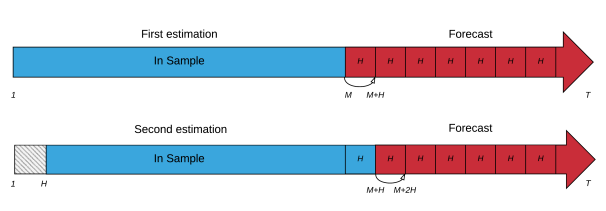

In [135]:
#####################################################################
#               UNCONDITIONAL APPROACH USING ROLLING WINDOWS        #
#####################################################################

#AJOUT PROf
def unconditional(method,M,H):
    #Rolling windows parameteres
    #M=1000#500  #windows size
    #H=22 #shift

    #initilisation
    L=0
    count=0
    num_rows, num_cols = price_data.shape
    opt_weights = [] #array to store optimal weights at each rebalance
    returns = [] #array to store historical returns of each window
    
    print("[", M,H,"]")
    
    #Rolling windows
    while (M +H*count) < num_rows:
        #updating Rolling windows parameteres
        L = M +H*count
        K = H*count


        # Portfolio Returns on window
        lg_returns = log_ret.iloc[K:L] #log returns for each window

        #uncondtional covariance for each window
        cov_mat = lg_returns.cov()
        cov_mat= cov_mat.to_numpy()
        
        if  method == "Minimum variance": 
            #################################################### Minimum variance ###################################################
            results = optimization(cov_mat, 0,"Minimum variance")
            
        elif method == "Maximum diversification":
        #################################################### Maximum Diversification ####################################################
            vol=  variance(equal_weights,cov_mat)
            results = optimization(cov_mat, vol,"Maximum diversification")
            
        else:
            #################################################### Risk Parity ###################################################
            results = optimization(cov_mat, 0,"Risk Parity")

        
        print("First estimation, in sample window:", price_data.index.to_numpy()[K:L][0], price_data.index.to_numpy()[K:L][-1])
        print("Optimal weights: ", results.x)
        print("These weights are constant during : [", price_data.index.to_numpy()[L:(M+ H*(count+1))][0], price_data.index.to_numpy()[L:(M+ H*(count+1))][-1])
        print(" ")
        
        # We save the optimal weights and returns in arrays, so we can use them later for sharpe ratio
        opt_weights.append(results.x)
        returns.append(logreturn(K, L))
        
        count= count + 1  
    return opt_weights,returns,M,H

# GARCH, DYNAMIC COVARIANCE

In [46]:
#calculer la moyenne de la matrice vol(volatilité) historique de la date [start:end]
def volatility(start,end,vol):
    return mean(vol.to_numpy()[start:end])

In [146]:
#####################################################################
#               UNCONDITIONAL APPROACH USING ROLLING WINDOWS        #
#####################################################################
def conditional(method,M,H):
    #Rolling windows parameteres
    #M=500 #windows size
    #H=1 #shift

    #initilisation
    L=0
    count=0
    num_rows, num_cols = price_data.shape
    opt_weights = [] #array to store optimal weights at each rebalance
    returns = [] #array to store historical returns of each window
    
    
    #Step 1
    #Model specification
    gm_amzn = arch_model(log_ret["AMZN"], p =1, q =1, mean ="constant", vol="GARCH", dist = "t", rescale=False)
    gm_aapl = arch_model(log_ret["AAPL"], p =1, q =1, mean ="constant", vol="GARCH", dist = "t", rescale=False)
    gm_nflx = arch_model(log_ret["NFLX"], p =1, q =1, mean ="constant", vol="GARCH", dist = "t", rescale=False)
    gm_goog = arch_model(log_ret["GOOG"], p =1, q =1, mean ="constant", vol="GARCH", dist = "t", rescale=False)
    
    
    #Rolling windows
    while (M +H*count) < num_rows:
        #updating Rolling windows parameteres
        L = M +H*count
        K = H*count
        
        vol = np.zeros((4,4)) #vol matrix, 4x4 because we study four assets
        
        print("[", K,L,"]")
        
        #Step 2
        # Model Fitting: garch parameters 
        #(omega, alpha and beta) are estimated using maximum likelihood method
        gm_amzn_result = gm_amzn.fit(first_obs = K, last_obs = L, disp = "off")
        gm_aapl_result = gm_aapl.fit(first_obs = K, last_obs = L, disp = "off")
        gm_nflx_result = gm_nflx.fit(first_obs = K, last_obs = L, disp = "off")
        gm_goog_result = gm_goog.fit(first_obs = K, last_obs = L, disp = "off")
        
        #Step3
        # Volatility calculus, diagonal matrix
        vol_amzn = gm_amzn_result.conditional_volatility
        vol_aapl = gm_aapl_result.conditional_volatility
        vol_nflx = gm_nflx_result.conditional_volatility
        vol_goog = gm_goog_result.conditional_volatility
        np.fill_diagonal(vol, [volatility(K,L,vol_amzn),volatility(K,L,vol_aapl),volatility(K,L,vol_nflx),volatility(K,L,vol_goog)])
        
        
        # Step 4
        # Compute standarized residuals from the fitted GARCH models
        gm_amzn_std_resid = gm_amzn_result.resid / vol_amzn
        gm_aapl_std_resid = gm_aapl_result.resid / vol_aapl
        gm_nflx_std_resid = gm_nflx_result.resid / vol_nflx
        gm_goog_std_resid = gm_goog_result.resid / vol_goog

        # Step 5
        # Compute the simple correlations of standarized residuals
        corr = np.corrcoef([gm_amzn_std_resid[K:L],gm_aapl_std_resid[K:L],gm_nflx_std_resid[K:L],gm_goog_std_resid[K:L]])
        
        # Step 6
        # Compute GARCH covariance 
        covariance = vol @ corr @ vol
        
        if  method == "Minimum variance": 
            #################################################### Minimum variance ###################################################
            results = optimization(covariance, 0,"Minimum variance")
            
        elif method == "Maximum diversification":
        #################################################### Maximum Diversification ####################################################
            var=  variance(equal_weights,covariance)
            results = optimization(covariance, var,"Maximum diversification")
            
        else:
            #################################################### Risk Parity ###################################################
            results = optimization(covariance, 0,"Risk Parity")
            
        print("First estimation, in sample window:", price_data.index.to_numpy()[K:L][0], price_data.index.to_numpy()[K:L][-1])
        print("Optimal weights: ", results.x)
        print("These weights are constant during : [", price_data.index.to_numpy()[L:(M+ H*(count+1))][0], price_data.index.to_numpy()[L:(M+ H*(count+1))][-1])
        print(" ")
        
        # We save the optimal weights and returns in arrays, so we can use them later for sharpe ratio
        opt_weights.append(results.x)
        returns.append(logreturn(K, L))
        #returns.append((arithret(K, L)))

        
        count = count + 1
    return opt_weights,returns,M,H

# Critères de performance

## Sharpe ratio

In [28]:
def sharpe_ratio(con_or_unconditional_info): #unconditional/conditional method as an argument
    weights = con_or_unconditional_info[0]
    returns = con_or_unconditional_infoo[1]
    window = con_or_unconditional_info[2]
    shift = con_or_unconditional_info[3]
    n1=len(weights)
   
    mu=0 # the empirical mean
    sigma =0 # the standard deviation
    sharpe=0
     
    for i in range(n1):
        for j in range(4):
            mu+=weights[i][j]*returns[i][j]       
    mu = mu /(n1)

    for i in range(n1):
        for j in range(4):
            sigma+= (weights[i][j]*returns[i][j] - mu)**2
    sigma= sigma/(n1 -1 )
    
    sharpe = mu /sigma
    
    print("Sharpe Ratio with windows size=",window ," and shift =",shift)
    
    return sharpe,mu,sigma

## Turnover

In [133]:
def tunrover(weights):
    #s= len(weights)-1
    s=len(weights)
    turnovers=0
    for i in  range(s-1):
        for j in  range(4):
            turnovers= np.abs(turnovers + (weights[i][j] - weights[s-1][j]))
    return turnovers/(s+1)

## Return loss

In [23]:
def return_loss(mean_cond,sdt_cond,mean_uncond,sdt_uncond):    
    return (mean_cond/sdt_cond)*(mean_uncond - sdt_uncond)

# 

# Tests

## Sharpe ratio test, conditional vs unconditional

#### Risk Parity

In [104]:
uncon_rp_500_1 = sharpe_ratio(unconditional("Risk Parity",500,1))
uncon_rp_500_1

[ 500 1 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22744689 0.3322859  0.15390255 0.28636466]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.22709866 0.33257165 0.15399139 0.2863383 ]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [0.22722548 0.33244456 0.15387578 0.28645417]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2015-12-30T00:00:00.000000000
Optimal weights:  [0.22718166 0.33216557 0.15442595 0.28622682]
Th

(0.08198528246918384, 5.2968642701138124, 64.60750162207184)

In [94]:
rp_500_1=sharpe_ratio(conditional("Risk Parity",500,1))

[ 0 500 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22856434 0.33635712 0.13442294 0.3006556 ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
[ 1 501 ]
Risk Parity
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.2283411  0.33250788 0.13989279 0.29925823]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
[ 2 502 ]
Risk Parity
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [0.2274972  0.33149846 0.14291628 0.29808806]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
[ 3 503 ]
Risk Parity
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2015-12-30T00:00:00.000000000
Optimal weights:  [0.22818906 0.3351

In [95]:
rp_500_1

(0.08154365602927095, 5.319026883813394, 65.22919308283251)

In [110]:
uncon_rp_500_5 = sharpe_ratio(unconditional("Risk Parity",500,5))
uncon_rp_500_5

[ 500 5 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22744689 0.3322859  0.15390255 0.28636466]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [0.22567714 0.33325731 0.15412001 0.28694554]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [0.22610613 0.3324413  0.15343242 0.28802015]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2016-01-19T00:00:00.000000000
Optimal weights:  [0.22357119 0.33334428 0.15527198 0.28781256]
Th

(0.08182157076198725, 5.293489366316659, 64.69552365005335)

In [56]:
rp_500_5=sharpe_ratio(conditional("Risk Parity",500,5))

[ 0 500 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22856434 0.33635712 0.13442294 0.3006556 ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
[ 5 505 ]
Risk Parity
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [0.22430607 0.33601534 0.14003358 0.299645  ]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
[ 10 510 ]
Risk Parity
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [0.22332783 0.33641823 0.13840044 0.30185349]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
[ 15 515 ]
Risk Parity
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2016-01-19T00:00:00.000000000
Optimal weights:  [0.22349358 0.33

In [57]:
rp_500_5

(0.08139088629694104, 5.31495127517019, 65.30155299918322)

In [115]:
uncon_rp_500_22 = sharpe_ratio(unconditional("Risk Parity",500,22))
uncon_rp_500_22

[ 500 22 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22744689 0.3322859  0.15390255 0.28636466]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [0.22602316 0.32907052 0.15564533 0.28926099]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.22443573 0.33093754 0.15378806 0.29083866]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2016-04-01T00:00:00.000000000
Optimal weights:  [0.225383   0.32690749 0.1544001  0.2933094 ]
T

(0.08062547425575357, 5.3116382011239285, 65.88039636548099)

In [63]:
rp_500_22=sharpe_ratio(conditional("Risk Parity",500,22))

[ 0 500 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22856434 0.33635712 0.13442294 0.3006556 ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
[ 22 522 ]
Risk Parity
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [0.21513172 0.33585495 0.14539214 0.30362119]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
[ 44 544 ]
Risk Parity
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.21012612 0.33667195 0.14720835 0.30599358]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
[ 66 566 ]
Risk Parity
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2016-04-01T00:00:00.000000000
Optimal weights:  [0.21626096 0.3

In [64]:
rp_500_22

(0.08024524277780118, 5.33061625182889, 66.42906255002991)

In [120]:
uncon_rp_1000_1 = sharpe_ratio(unconditional("Risk Parity",1000,1))
uncon_rp_1000_1

[ 1000 1 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23043231 0.32079064 0.15254538 0.29623168]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.23032995 0.32104824 0.15237971 0.2962421 ]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [0.23030701 0.3210566  0.15238479 0.2962516 ]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2017-12-22T00:00:00.000000000
Optimal weights:  [0.23046475 0.32077396 0.15260777 0.29615352]
T

(0.040334795029268115, 10.92115930888691, 270.76273230004506)

In [71]:
rp_1000_1=sharpe_ratio(conditional("Risk Parity",1000,1))

[ 0 1000 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23391542 0.31945189 0.14408745 0.30254524]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
[ 1 1001 ]
Risk Parity
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.23431061 0.31890359 0.14418999 0.3025958 ]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
[ 2 1002 ]
Risk Parity
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [0.23459593 0.31908643 0.14383315 0.30248449]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
[ 3 1003 ]
Risk Parity
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2017-12-22T00:00:00.000000000
Optimal weights:  [0.23458841 0.

In [72]:
rp_1000_1

(0.040229184916611704, 10.937233167255481, 271.8730988441977)

In [126]:
uncon_rp_1000_5 = sharpe_ratio(unconditional("Risk Parity",1000,5))
uncon_rp_1000_5

[ 1000 5 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23043231 0.32079064 0.15254538 0.29623168]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [0.23043665 0.32092209 0.15242075 0.29622051]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [0.23060496 0.3212078  0.15175493 0.2964323 ]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2018-01-11T00:00:00.000000000
Optimal weights:  [0.2294046  0.32122954 0.15335266 0.29601319]
T

(0.04018369415273018, 10.919223272644587, 271.73268916349014)

In [78]:
rp_1000_5=sharpe_ratio(conditional("Risk Parity",1000,5))

[ 0 1000 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23391542 0.31945189 0.14408745 0.30254524]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
[ 5 1005 ]
Risk Parity
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [0.23596301 0.31928018 0.14192766 0.30282915]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
[ 10 1010 ]
Risk Parity
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [0.23911163 0.3204688  0.13532987 0.3050897 ]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
[ 15 1015 ]
Risk Parity
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2018-01-11T00:00:00.000000000
Optimal weights:  [0.23320689 

In [79]:
rp_1000_5

(0.04008036180340522, 10.934810977749205, 272.82216241920713)

In [137]:
uncon_rp_1000_22 = sharpe_ratio(unconditional("Risk Parity",1000,22))
uncon_rp_1000_22

[ 1000 22 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23043231 0.32079064 0.15254538 0.29623168]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2018-01-23T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2018-01-23T00:00:00.000000000
Optimal weights:  [0.23191822 0.32181303 0.15006178 0.29620698]
These weights are constant during : [ 2018-01-24T00:00:00.000000000 2018-02-23T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2018-02-23T00:00:00.000000000
Optimal weights:  [0.23531172 0.3193389  0.15220113 0.29314826]
These weights are constant during : [ 2018-02-26T00:00:00.000000000 2018-03-27T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2018-03-27T00:00:00.000000000
Optimal weights:  [0.23707284 0.31701052 0.1531039  0.29281274]


(0.03958134350299781, 10.903212520192717, 275.46342683812463)

In [85]:
rp_1000_22=sharpe_ratio(conditional("Risk Parity",1000,22))

[ 0 1000 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23391542 0.31945189 0.14408745 0.30254524]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2018-01-23T00:00:00.000000000
 
[ 22 1022 ]
Risk Parity
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2018-01-23T00:00:00.000000000
Optimal weights:  [0.23516204 0.31687903 0.14868847 0.29927047]
These weights are constant during : [ 2018-01-24T00:00:00.000000000 2018-02-23T00:00:00.000000000
 
[ 44 1044 ]
Risk Parity
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2018-02-23T00:00:00.000000000
Optimal weights:  [0.23559348 0.31164075 0.1578552  0.29491057]
These weights are constant during : [ 2018-02-26T00:00:00.000000000 2018-03-27T00:00:00.000000000
 
[ 66 1066 ]
Risk Parity
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2018-03-27T00:00:00.000000000
Optimal weights:  [0.24134537

In [86]:
rp_1000_22

(0.039478374470340104, 10.919535533843659, 276.5953684857883)

# 

#### Minimum variance 

In [106]:
uncon_mv_500_1 = sharpe_ratio(unconditional("Minimum variance",500,1))
uncon_mv_500_1

[ 500 1 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.08630579 0.497803   0.03455405 0.38133717]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.0846005  0.49972625 0.03438409 0.38128916]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [0.08426772 0.49938938 0.03373489 0.38260801]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2015-12-30T00:00:00.000000000
Optimal weights:  [0.08402741 0.49886681 0.033

(0.09413439018510356, 4.298509938299198, 45.663544745408274)

In [96]:
mv_500_1 = sharpe_ratio(conditional("Minimum variance",500,1))

[ 0 500 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.05428393 0.47410846 0.01716147 0.45444615]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
[ 1 501 ]
Minimum variance
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.05391566 0.46955999 0.02007927 0.45644509]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
[ 2 502 ]
Minimum variance
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [0.05252744 0.4695951  0.02238949 0.45548797]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
[ 3 503 ]
Minimum variance
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2015-12-30T00:00:00.000000000
Optimal weights:

In [97]:
mv_500_1

(0.09115274672111942, 4.59008970286928, 50.35602182030341)

In [111]:
uncon_mv_500_5 = sharpe_ratio(unconditional("Minimum variance",500,5))
uncon_mv_500_5

[ 500 5 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.08630579 0.497803   0.03455405 0.38133717]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [0.07960561 0.50052569 0.03204505 0.38782364]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [0.07688617 0.49664968 0.03168774 0.39477641]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2016-01-19T00:00:00.000000000
Optimal weights:  [0.06831939 0.50326513 0.027

(0.09391279463210853, 4.29720189581853, 45.757363654784996)

In [58]:
mv_500_5 = sharpe_ratio(conditional("Minimum variance",500,5))

[ 0 500 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.05428393 0.47410846 0.01716147 0.45444615]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
[ 5 505 ]
Minimum variance
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [0.04216098 0.47792533 0.01861494 0.46129875]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
[ 10 510 ]
Minimum variance
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [0.0345666  0.47580515 0.01698032 0.47264794]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
[ 15 515 ]
Minimum variance
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2016-01-19T00:00:00.000000000
Optimal weight

In [59]:
mv_500_5

(0.090954698488047, 4.587003311722685, 50.43173566592049)

In [116]:
uncon_mv_500_22 = sharpe_ratio(unconditional("Minimum variance",500,22))
uncon_mv_500_22

[ 500 22 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.08630579 0.497803   0.03455405 0.38133717]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [0.06249789 0.4997435  0.02327793 0.41448068]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.05201557 0.51135209 0.01479353 0.42183881]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2016-04-01T00:00:00.000000000
Optimal weights:  [0.05398698 0.49502439 0.01

(0.09284503402857588, 4.300033487300034, 46.31409242605876)

In [65]:
mv_500_22 = sharpe_ratio(conditional("Minimum variance",500,22))

[ 0 500 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.05428393 0.47410846 0.01716147 0.45444615]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
[ 22 522 ]
Minimum variance
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [0.         0.48046462 0.01428514 0.50525024]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
[ 44 544 ]
Minimum variance
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.         0.48129896 0.01013848 0.50856256]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
[ 66 566 ]
Minimum variance
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2016-04-01T00:00:00.000000000
Optimal weigh

In [66]:
mv_500_22

(0.0899895788740912, 4.585214247071254, 50.952724798130795)

In [121]:
uncon_mv_1000_1 = sharpe_ratio(unconditional("Minimum variance",1000,1))
uncon_mv_1000_1

[ 1000 1 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.06703264 0.45651945 0.01754858 0.45889933]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.06667297 0.45758464 0.01729532 0.45844706]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [0.06620243 0.45761424 0.01717018 0.45901314]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2017-12-22T00:00:00.000000000
Optimal weights:  [0.06727108 0.45576221 0.01

(0.046354620874082646, 9.108297498660672, 196.4916836101925)

In [73]:
mv_1000_1 = sharpe_ratio(conditional("Minimum variance",1000,1))

[ 0 1000 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.04956972 0.43032825 0.01159985 0.50850218]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
[ 1 1001 ]
Minimum variance
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.05068871 0.42813659 0.01138212 0.50979258]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
[ 2 1002 ]
Minimum variance
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [0.05067528 0.42957103 0.01074156 0.50901213]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
[ 3 1003 ]
Minimum variance
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2017-12-22T00:00:00.000000000
Optimal weig

In [74]:
mv_1000_1

(0.0446978944955566, 9.546504958751562, 213.57840378142592)

In [127]:
uncon_mv_1000_5 = sharpe_ratio(unconditional("Minimum variance",1000,5))
uncon_mv_1000_5

[ 1000 5 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.06703264 0.45651945 0.01754858 0.45889933]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [0.06713528 0.45612065 0.01642973 0.46031434]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [0.06676789 0.45751417 0.01439603 0.4613219 ]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2018-01-11T00:00:00.000000000
Optimal weights:  [0.06564418 0.45832523 0.01

(0.04617298144193243, 9.107629814816562, 197.25019980072983)

In [80]:
mv_1000_5 = sharpe_ratio(conditional("Minimum variance",1000,5))

[ 0 1000 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.04956972 0.43032825 0.01159985 0.50850218]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
[ 5 1005 ]
Minimum variance
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [0.05485098 0.42832322 0.00829686 0.50852894]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
[ 10 1010 ]
Minimum variance
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [0.05932444 0.42698959 0.         0.51368597]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
[ 15 1015 ]
Minimum variance
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2018-01-11T00:00:00.000000000
Optimal we

In [81]:
mv_1000_5

(0.04454499354229706, 9.541305825655352, 214.19479647236994)

uncon_mv_1000_22 = sharpe_ratio(unconditional("Minimum variance",1000,22))
uncon_mv_1000_22

In [87]:
mv_1000_22= sharpe_ratio(conditional("Minimum variance",1000,22))

[ 0 1000 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.04956972 0.43032825 0.01159985 0.50850218]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2018-01-23T00:00:00.000000000
 
[ 22 1022 ]
Minimum variance
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2018-01-23T00:00:00.000000000
Optimal weights:  [0.05205224 0.43065601 0.01330379 0.50398797]
These weights are constant during : [ 2018-01-24T00:00:00.000000000 2018-02-23T00:00:00.000000000
 
[ 44 1044 ]
Minimum variance
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2018-02-23T00:00:00.000000000
Optimal weights:  [0.07185436 0.42234508 0.02540881 0.48039175]
These weights are constant during : [ 2018-02-26T00:00:00.000000000 2018-03-27T00:00:00.000000000
 
[ 66 1066 ]
Minimum variance
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2018-03-27T00:00:00.000000000
Optimal w

In [88]:
mv_1000_22

(0.04381885972907798, 9.5406099716129, 217.7283943626173)

# 

#### Maximum diversification

In [107]:
uncon_md_500_1 = sharpe_ratio(unconditional("Maximum diversification",500,1))
uncon_md_500_1

[ 500 1 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.27970793 0.26313625 0.45715582 0.        ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.28052788 0.26139019 0.45808193 0.        ]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [0.28083413 0.26048158 0.45868429 0.        ]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2015-12-30T00:00:00.000000000
Optimal weights:  

(0.059905434077721836, 6.4632832612382405, 107.89143523862494)

In [98]:
md_500_1= sharpe_ratio(conditional("Maximum diversification",500,1))

[ 0 500 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [2.63187918e-01 2.59014689e-01 4.77797393e-01 2.15756232e-17]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
[ 1 501 ]
Maximum diversification
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.27147836 0.25279722 0.47572442 0.        ]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
[ 2 502 ]
Maximum diversification
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [2.73684924e-01 2.53331841e-01 4.72983235e-01 4.22838847e-18]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
[ 3 503 ]
Maximum diversification
First estimation, in sample window: 2014-01-07T00:00

In [99]:
md_500_1

(0.0624605733930434, 6.277804110647342, 100.50826897062295)

In [112]:
uncon_md_500_5 = sharpe_ratio(unconditional("Maximum diversification",500,5))
uncon_md_500_5

[ 500 5 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.27970793 0.26313625 0.45715582 0.        ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [2.80593865e-01 2.62496790e-01 4.56909345e-01 1.73472348e-18]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [2.76231952e-01 2.63752789e-01 4.60015258e-01 8.67361738e-18]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2016-01-19T00:00

(0.059797001959631085, 6.457928150177785, 107.99752393167684)

In [60]:
md_500_5= sharpe_ratio(conditional("Maximum diversification",500,5))

[ 0 500 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [2.63187918e-01 2.59014689e-01 4.77797393e-01 2.15756232e-17]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
[ 5 505 ]
Maximum diversification
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [0.26973665 0.25727599 0.47298736 0.        ]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
[ 10 510 ]
Maximum diversification
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [0.26736352 0.25527576 0.47736072 0.        ]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
[ 15 515 ]
Maximum diversification
First estimation, in sample window: 2014-01-24T00:00:00.000000000 

In [61]:
md_500_5

(0.062305162736010035, 6.274374253793226, 100.70392208713187)

In [117]:
uncon_md_500_22 = sharpe_ratio(unconditional("Maximum diversification",500,22))
uncon_md_500_22

[ 500 22 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.27970793 0.26313625 0.45715582 0.        ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [2.70540665e-01 2.43426635e-01 4.86032700e-01 3.78386558e-17]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.27732859 0.2252477  0.49742371 0.        ]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2016-04-01T00:00:00.000000000
O

(0.05877873566433744, 6.496762479614901, 110.52912938984247)

In [67]:
md_500_22= sharpe_ratio(conditional("Maximum diversification",500,22))

[ 0 500 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [2.63187918e-01 2.59014689e-01 4.77797393e-01 2.15756232e-17]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
[ 22 522 ]
Maximum diversification
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [0.27379576 0.23416084 0.4920434  0.        ]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
[ 44 544 ]
Maximum diversification
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.28943624 0.21848943 0.49207433 0.        ]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
[ 66 566 ]
Maximum diversification
First estimation, in sample window: 2014-04-08T00:00:00.000000000

In [68]:
md_500_22

(0.06117263912957871, 6.3137620641728915, 103.2121901884728)

In [122]:
uncon_md_1000_1 = sharpe_ratio(unconditional("Maximum diversification",1000,1))
uncon_md_1000_1

[ 1000 1 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.2799762  0.23289141 0.48713238 0.        ]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.28036992 0.23218647 0.48744361 0.        ]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [0.28057567 0.23193958 0.48748475 0.        ]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2017-12-22T00:00:00.000000000
Optimal weights: 

(0.029931963093871305, 13.275521626827006, 443.52325255757194)

In [75]:
md_1000_1= sharpe_ratio(conditional("Maximum diversification",1000,1))

[ 0 1000 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [2.65009550e-01 2.36875736e-01 4.98114714e-01 2.16840434e-17]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
[ 1 1001 ]
Maximum diversification
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.26420388 0.23781766 0.49797846 0.        ]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
[ 2 1002 ]
Maximum diversification
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [2.64142541e-01 2.36828607e-01 4.99028852e-01 3.03576608e-17]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
[ 3 1003 ]
Maximum diversification
First estimation, in sample window: 2014-01-07T0

In [76]:
md_1000_1

(0.031217646477313097, 12.944391034523791, 414.64980532503984)

In [128]:
uncon_md_1000_5 = sharpe_ratio(unconditional("Maximum diversification",1000,5))
uncon_md_1000_5

[ 1000 5 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.2799762  0.23289141 0.48713238 0.        ]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [0.27938836 0.23400619 0.48660545 0.        ]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [2.79672110e-01 2.31442791e-01 4.88885099e-01 3.56702515e-17]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2018-01-11T00:00:00.000000000
O

(0.029817899798127944, 13.273992855148034, 445.16860493244445)

In [82]:
md_1000_5= sharpe_ratio(conditional("Maximum diversification",1000,5))

[ 0 1000 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [2.65009550e-01 2.36875736e-01 4.98114714e-01 2.16840434e-17]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
[ 5 1005 ]
Maximum diversification
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [2.60616573e-01 2.37625885e-01 5.01757542e-01 4.33680869e-18]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
[ 10 1010 ]
Maximum diversification
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [0.25020226 0.23393861 0.51585913 0.        ]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
[ 15 1015 ]
Maximum diversification
First estimation, in sample window: 2014-01-24

In [83]:
md_1000_5

(0.031093057437709383, 12.94498882058209, 416.33052158076043)

In [132]:
uncon_md_1000_22 = sharpe_ratio(unconditional("Maximum diversification",1000,22))
uncon_md_1000_22

[ 1000 22 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.2799762  0.23289141 0.48713238 0.        ]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2018-01-23T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2018-01-23T00:00:00.000000000
Optimal weights:  [2.65882335e-01 2.25783279e-01 5.08334386e-01 3.74049750e-17]
These weights are constant during : [ 2018-01-24T00:00:00.000000000 2018-02-23T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2018-02-23T00:00:00.000000000
Optimal weights:  [2.62347337e-01 2.26454637e-01 5.11198026e-01 4.33680869e-18]
These weights are constant during : [ 2018-02-26T00:00:00.000000000 2018-03-27T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2018-03-27T00:

(0.02950268131996723, 13.203867774561887, 447.548059491989)

In [91]:
md_1000_22 =  sharpe_ratio(conditional("Maximum diversification",1000,22))

[ 0 1000 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [2.65009550e-01 2.36875736e-01 4.98114714e-01 2.16840434e-17]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2018-01-23T00:00:00.000000000
 
[ 22 1022 ]
Maximum diversification
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2018-01-23T00:00:00.000000000
Optimal weights:  [0.24747293 0.24731521 0.50521186 0.        ]
These weights are constant during : [ 2018-01-24T00:00:00.000000000 2018-02-23T00:00:00.000000000
 
[ 44 1044 ]
Maximum diversification
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2018-02-23T00:00:00.000000000
Optimal weights:  [2.56008181e-01 2.51862486e-01 4.92129333e-01 2.59124319e-17]
These weights are constant during : [ 2018-02-26T00:00:00.000000000 2018-03-27T00:00:00.000000000
 
[ 66 1066 ]
Maximum diversification
First estimation, in sample window: 2014-04-0

In [92]:
md_1000_22

(0.030789609753035095, 12.871298079006646, 418.04031237316525)

# 

# 

## Turn over, conditional vs unconditional

#### Risk parity

In [139]:
tunrover(unconditional("Risk Parity",500,1)[0])

[ 500 1 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22744689 0.3322859  0.15390255 0.28636466]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.22709866 0.33257165 0.15399139 0.2863383 ]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [0.22722548 0.33244456 0.15387578 0.28645417]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2015-12-30T00:00:00.000000000
Optimal weights:  [0.22718166 0.33216557 0.15442595 0.28622682]
Th

5.264932557527954e-05

In [147]:
tunrover(conditional("Risk Parity",500,1)[0])

[ 0 500 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22856434 0.33635712 0.13442294 0.3006556 ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
[ 1 501 ]
Risk Parity
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.2283411  0.33250788 0.13989279 0.29925823]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
[ 2 502 ]
Risk Parity
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [0.2274972  0.33149846 0.14291628 0.29808806]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
[ 3 503 ]
Risk Parity
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2015-12-30T00:00:00.000000000
Optimal weights:  [0.22818906 0.3351

3.85233644758258e-05

In [141]:
tunrover(unconditional("Risk Parity",500,5)[0])

[ 500 5 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22744689 0.3322859  0.15390255 0.28636466]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [0.22567714 0.33325731 0.15412001 0.28694554]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [0.22610613 0.3324413  0.15343242 0.28802015]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2016-01-19T00:00:00.000000000
Optimal weights:  [0.22357119 0.33334428 0.15527198 0.28781256]
Th

0.00026271697728565027

In [148]:
tunrover(conditional("Risk Parity",500,5)[0])

[ 0 500 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22856434 0.33635712 0.13442294 0.3006556 ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
[ 5 505 ]
Risk Parity
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [0.22430607 0.33601534 0.14003358 0.299645  ]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
[ 10 510 ]
Risk Parity
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [0.22332783 0.33641823 0.13840044 0.30185349]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
[ 15 515 ]
Risk Parity
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2016-01-19T00:00:00.000000000
Optimal weights:  [0.22349358 0.33

0.00019201375599311196

In [140]:
tunrover(unconditional("Risk Parity",500,22)[0])

[ 500 22 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22744689 0.3322859  0.15390255 0.28636466]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [0.22602316 0.32907052 0.15564533 0.28926099]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.22443573 0.33093754 0.15378806 0.29083866]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2016-04-01T00:00:00.000000000
Optimal weights:  [0.225383   0.32690749 0.1544001  0.2933094 ]
T

0.0011206961990965578

In [149]:
tunrover(conditional("Risk Parity",500,22)[0])

[ 0 500 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.22856434 0.33635712 0.13442294 0.3006556 ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
[ 22 522 ]
Risk Parity
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [0.21513172 0.33585495 0.14539214 0.30362119]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
[ 44 544 ]
Risk Parity
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.21012612 0.33667195 0.14720835 0.30599358]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
[ 66 566 ]
Risk Parity
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2016-04-01T00:00:00.000000000
Optimal weights:  [0.21626096 0.3

0.0007437240589928602

In [142]:
tunrover(unconditional("Risk Parity",1000,1)[0])

[ 1000 1 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23043231 0.32079064 0.15254538 0.29623168]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.23032995 0.32104824 0.15237971 0.2962421 ]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [0.23030701 0.3210566  0.15238479 0.2962516 ]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2017-12-22T00:00:00.000000000
Optimal weights:  [0.23046475 0.32077396 0.15260777 0.29615352]
T

5.599455690719998e-05

In [150]:
tunrover(conditional("Risk Parity",1000,1)[0])

[ 0 1000 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23391542 0.31945189 0.14408745 0.30254524]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
[ 1 1001 ]
Risk Parity
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.23431061 0.31890359 0.14418999 0.3025958 ]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
[ 2 1002 ]
Risk Parity
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [0.23459593 0.31908643 0.14383315 0.30248449]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
[ 3 1003 ]
Risk Parity
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2017-12-22T00:00:00.000000000
Optimal weights:  [0.23458841 0.

4.9994035339258236e-05

In [143]:
tunrover(unconditional("Risk Parity",1000,5)[0])

[ 1000 5 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23043231 0.32079064 0.15254538 0.29623168]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [0.23043665 0.32092209 0.15242075 0.29622051]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [0.23060496 0.3212078  0.15175493 0.2964323 ]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2018-01-11T00:00:00.000000000
Optimal weights:  [0.2294046  0.32122954 0.15335266 0.29601319]
T

0.00027829235899576733

In [151]:
tunrover(conditional("Risk Parity",1000,5)[0])

[ 0 1000 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23391542 0.31945189 0.14408745 0.30254524]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
[ 5 1005 ]
Risk Parity
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [0.23596301 0.31928018 0.14192766 0.30282915]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
[ 10 1010 ]
Risk Parity
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [0.23911163 0.3204688  0.13532987 0.3050897 ]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
[ 15 1015 ]
Risk Parity
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2018-01-11T00:00:00.000000000
Optimal weights:  [0.23320689 

0.0002494841641430172

In [144]:
tunrover(unconditional("Risk Parity",1000,22)[0])

[ 1000 22 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23043231 0.32079064 0.15254538 0.29623168]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2018-01-23T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2018-01-23T00:00:00.000000000
Optimal weights:  [0.23191822 0.32181303 0.15006178 0.29620698]
These weights are constant during : [ 2018-01-24T00:00:00.000000000 2018-02-23T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2018-02-23T00:00:00.000000000
Optimal weights:  [0.23531172 0.3193389  0.15220113 0.29314826]
These weights are constant during : [ 2018-02-26T00:00:00.000000000 2018-03-27T00:00:00.000000000
 
Risk Parity
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2018-03-27T00:00:00.000000000
Optimal weights:  [0.23707284 0.31701052 0.1531039  0.29281274]


0.0011842008996329437

In [152]:
tunrover(conditional("Risk Parity",1000,22)[0])

[ 0 1000 ]
Risk Parity
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.23391542 0.31945189 0.14408745 0.30254524]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2018-01-23T00:00:00.000000000
 
[ 22 1022 ]
Risk Parity
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2018-01-23T00:00:00.000000000
Optimal weights:  [0.23516204 0.31687903 0.14868847 0.29927047]
These weights are constant during : [ 2018-01-24T00:00:00.000000000 2018-02-23T00:00:00.000000000
 
[ 44 1044 ]
Risk Parity
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2018-02-23T00:00:00.000000000
Optimal weights:  [0.23559348 0.31164075 0.1578552  0.29491057]
These weights are constant during : [ 2018-02-26T00:00:00.000000000 2018-03-27T00:00:00.000000000
 
[ 66 1066 ]
Risk Parity
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2018-03-27T00:00:00.000000000
Optimal weights:  [0.24134537

0.0010560927617587791

# 

#### Minimum variance

In [153]:
tunrover(unconditional("Minimum variance",500,1)[0])

[ 500 1 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.08630579 0.497803   0.03455405 0.38133717]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.0846005  0.49972625 0.03438409 0.38128916]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [0.08426772 0.49938938 0.03373489 0.38260801]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2015-12-30T00:00:00.000000000
Optimal weights:  [0.08402741 0.49886681 0.033

0.00039922289840066405

In [154]:
tunrover(conditional("Minimum variance",500,1)[0])

[ 0 500 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.05428393 0.47410846 0.01716147 0.45444615]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
[ 1 501 ]
Minimum variance
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.05391566 0.46955999 0.02007927 0.45644509]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
[ 2 502 ]
Minimum variance
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [0.05252744 0.4695951  0.02238949 0.45548797]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
[ 3 503 ]
Minimum variance
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2015-12-30T00:00:00.000000000
Optimal weights:

0.00029021264489232507

In [155]:
tunrover(unconditional("Minimum variance",500,5)[0])

[ 500 5 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.08630579 0.497803   0.03455405 0.38133717]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [0.07960561 0.50052569 0.03204505 0.38782364]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [0.07688617 0.49664968 0.03168774 0.39477641]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2016-01-19T00:00:00.000000000
Optimal weights:  [0.06831939 0.50326513 0.027

0.0019957065320201236

In [156]:
tunrover(conditional("Minimum variance",500,5)[0])

[ 0 500 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.05428393 0.47410846 0.01716147 0.45444615]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
[ 5 505 ]
Minimum variance
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [0.04216098 0.47792533 0.01861494 0.46129875]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
[ 10 510 ]
Minimum variance
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [0.0345666  0.47580515 0.01698032 0.47264794]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
[ 15 515 ]
Minimum variance
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2016-01-19T00:00:00.000000000
Optimal weight

0.001441531307443159

In [157]:
tunrover(unconditional("Minimum variance",500,22)[0])

[ 500 22 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.08630579 0.497803   0.03455405 0.38133717]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [0.06249789 0.4997435  0.02327793 0.41448068]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.05201557 0.51135209 0.01479353 0.42183881]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2016-04-01T00:00:00.000000000
Optimal weights:  [0.05398698 0.49502439 0.01

0.008436390373744218

In [158]:
tunrover(conditional("Minimum variance",500,22)[0])

[ 0 500 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.05428393 0.47410846 0.01716147 0.45444615]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
[ 22 522 ]
Minimum variance
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [0.         0.48046462 0.01428514 0.50525024]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
[ 44 544 ]
Minimum variance
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.         0.48129896 0.01013848 0.50856256]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
[ 66 566 ]
Minimum variance
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2016-04-01T00:00:00.000000000
Optimal weigh

0.005475121078930439

In [159]:
tunrover(unconditional("Minimum variance",1000,1)[0])

[ 1000 1 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.06703264 0.45651945 0.01754858 0.45889933]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.06667297 0.45758464 0.01729532 0.45844706]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [0.06620243 0.45761424 0.01717018 0.45901314]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2017-12-22T00:00:00.000000000
Optimal weights:  [0.06727108 0.45576221 0.01

0.0004303512792505404

In [160]:
tunrover(conditional("Minimum variance",1000,1)[0])

[ 0 1000 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.04956972 0.43032825 0.01159985 0.50850218]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
[ 1 1001 ]
Minimum variance
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.05068871 0.42813659 0.01138212 0.50979258]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
[ 2 1002 ]
Minimum variance
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [0.05067528 0.42957103 0.01074156 0.50901213]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
[ 3 1003 ]
Minimum variance
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2017-12-22T00:00:00.000000000
Optimal weig

0.00044547120727223856

In [161]:
tunrover(unconditional("Minimum variance",1000,5)[0])

[ 1000 5 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.06703264 0.45651945 0.01754858 0.45889933]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [0.06713528 0.45612065 0.01642973 0.46031434]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [0.06676789 0.45751417 0.01439603 0.4613219 ]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2018-01-11T00:00:00.000000000
Optimal weights:  [0.06564418 0.45832523 0.01

0.002135274088706256

In [162]:
tunrover(conditional("Minimum variance",1000,5)[0])

[ 0 1000 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.04956972 0.43032825 0.01159985 0.50850218]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
[ 5 1005 ]
Minimum variance
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [0.05485098 0.42832322 0.00829686 0.50852894]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
[ 10 1010 ]
Minimum variance
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [0.05932444 0.42698959 0.         0.51368597]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
[ 15 1015 ]
Minimum variance
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2018-01-11T00:00:00.000000000
Optimal we

0.0022297476700203402

In [163]:
tunrover(unconditional("Minimum variance",1000,22)[0])

[ 1000 22 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.06703264 0.45651945 0.01754858 0.45889933]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2018-01-23T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2018-01-23T00:00:00.000000000
Optimal weights:  [0.05828662 0.46548898 0.00964693 0.46657746]
These weights are constant during : [ 2018-01-24T00:00:00.000000000 2018-02-23T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2018-02-23T00:00:00.000000000
Optimal weights:  [0.08034197 0.46463521 0.01078176 0.44424106]
These weights are constant during : [ 2018-02-26T00:00:00.000000000 2018-03-27T00:00:00.000000000
 
Minimum variance
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2018-03-27T00:00:00.000000000
Optimal weights:  [0.08616934 0.46287683 0.0

0.00910012643477673

In [164]:
tunrover(conditional("Minimum variance",1000,22)[0])

[ 0 1000 ]
Minimum variance
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.04956972 0.43032825 0.01159985 0.50850218]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2018-01-23T00:00:00.000000000
 
[ 22 1022 ]
Minimum variance
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2018-01-23T00:00:00.000000000
Optimal weights:  [0.05205224 0.43065601 0.01330379 0.50398797]
These weights are constant during : [ 2018-01-24T00:00:00.000000000 2018-02-23T00:00:00.000000000
 
[ 44 1044 ]
Minimum variance
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2018-02-23T00:00:00.000000000
Optimal weights:  [0.07185436 0.42234508 0.02540881 0.48039175]
These weights are constant during : [ 2018-02-26T00:00:00.000000000 2018-03-27T00:00:00.000000000
 
[ 66 1066 ]
Minimum variance
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2018-03-27T00:00:00.000000000
Optimal w

0.009419464135491171

# 

#### Maximum diversification

In [165]:
tunrover(unconditional("Maximum diversification",500,1)[0])

[ 500 1 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.27970793 0.26313625 0.45715582 0.        ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.28052788 0.26139019 0.45808193 0.        ]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [0.28083413 0.26048158 0.45868429 0.        ]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2015-12-30T00:00:00.000000000
Optimal weights:  

8.727570960786825e-05

In [166]:
tunrover(conditional("Maximum diversification",500,1)[0])

[ 0 500 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [2.63187918e-01 2.59014689e-01 4.77797393e-01 2.15756232e-17]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2015-12-28T00:00:00.000000000
 
[ 1 501 ]
Maximum diversification
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2015-12-28T00:00:00.000000000
Optimal weights:  [0.27147836 0.25279722 0.47572442 0.        ]
These weights are constant during : [ 2015-12-29T00:00:00.000000000 2015-12-29T00:00:00.000000000
 
[ 2 502 ]
Maximum diversification
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2015-12-29T00:00:00.000000000
Optimal weights:  [2.73684924e-01 2.53331841e-01 4.72983235e-01 4.22838847e-18]
These weights are constant during : [ 2015-12-30T00:00:00.000000000 2015-12-30T00:00:00.000000000
 
[ 3 503 ]
Maximum diversification
First estimation, in sample window: 2014-01-07T00:00

0.00010438291605334118

In [167]:
tunrover(unconditional("Maximum diversification",500,5)[0])

[ 500 5 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.27970793 0.26313625 0.45715582 0.        ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [2.80593865e-01 2.62496790e-01 4.56909345e-01 1.73472348e-18]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [2.76231952e-01 2.63752789e-01 4.60015258e-01 8.67361738e-18]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2016-01-19T00:00

0.0004187393901081226

In [169]:
tunrover(conditional("Maximum diversification",500,5)[0])

[ 0 500 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [2.63187918e-01 2.59014689e-01 4.77797393e-01 2.15756232e-17]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-04T00:00:00.000000000
 
[ 5 505 ]
Maximum diversification
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2016-01-04T00:00:00.000000000
Optimal weights:  [0.26973665 0.25727599 0.47298736 0.        ]
These weights are constant during : [ 2016-01-05T00:00:00.000000000 2016-01-11T00:00:00.000000000
 
[ 10 510 ]
Maximum diversification
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2016-01-11T00:00:00.000000000
Optimal weights:  [0.26736352 0.25527576 0.47736072 0.        ]
These weights are constant during : [ 2016-01-12T00:00:00.000000000 2016-01-19T00:00:00.000000000
 
[ 15 515 ]
Maximum diversification
First estimation, in sample window: 2014-01-24T00:00:00.000000000 

0.0004185182166987521

In [170]:
tunrover(unconditional("Maximum diversification",500,22)[0])

[ 500 22 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [0.27970793 0.26313625 0.45715582 0.        ]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [2.70540665e-01 2.43426635e-01 4.86032700e-01 3.78386558e-17]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.27732859 0.2252477  0.49742371 0.        ]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2016-04-01T00:00:00.000000000
O

0.0018079454443982218

In [171]:
tunrover(conditional("Maximum diversification",500,22)[0])

[ 0 500 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2015-12-24T00:00:00.000000000
Optimal weights:  [2.63187918e-01 2.59014689e-01 4.77797393e-01 2.15756232e-17]
These weights are constant during : [ 2015-12-28T00:00:00.000000000 2016-01-28T00:00:00.000000000
 
[ 22 522 ]
Maximum diversification
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2016-01-28T00:00:00.000000000
Optimal weights:  [0.27379576 0.23416084 0.4920434  0.        ]
These weights are constant during : [ 2016-01-29T00:00:00.000000000 2016-03-01T00:00:00.000000000
 
[ 44 544 ]
Maximum diversification
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2016-03-01T00:00:00.000000000
Optimal weights:  [0.28943624 0.21848943 0.49207433 0.        ]
These weights are constant during : [ 2016-03-02T00:00:00.000000000 2016-04-01T00:00:00.000000000
 
[ 66 566 ]
Maximum diversification
First estimation, in sample window: 2014-04-08T00:00:00.000000000

0.0019388453743206702

In [172]:
tunrover(unconditional("Maximum diversification",1000,1)[0])

[ 1000 1 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.2799762  0.23289141 0.48713238 0.        ]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.28036992 0.23218647 0.48744361 0.        ]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [0.28057567 0.23193958 0.48748475 0.        ]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-07T00:00:00.000000000 2017-12-22T00:00:00.000000000
Optimal weights: 

2.502349901608095e-05

In [173]:
tunrover(conditional("Maximum diversification",1000,1)[0])

[ 0 1000 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [2.65009550e-01 2.36875736e-01 4.98114714e-01 2.16840434e-17]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-20T00:00:00.000000000
 
[ 1 1001 ]
Maximum diversification
First estimation, in sample window: 2014-01-03T00:00:00.000000000 2017-12-20T00:00:00.000000000
Optimal weights:  [0.26420388 0.23781766 0.49797846 0.        ]
These weights are constant during : [ 2017-12-21T00:00:00.000000000 2017-12-21T00:00:00.000000000
 
[ 2 1002 ]
Maximum diversification
First estimation, in sample window: 2014-01-06T00:00:00.000000000 2017-12-21T00:00:00.000000000
Optimal weights:  [2.64142541e-01 2.36828607e-01 4.99028852e-01 3.03576608e-17]
These weights are constant during : [ 2017-12-22T00:00:00.000000000 2017-12-22T00:00:00.000000000
 
[ 3 1003 ]
Maximum diversification
First estimation, in sample window: 2014-01-07T0

4.3035347998875095e-05

In [174]:
tunrover(unconditional("Maximum diversification",1000,5)[0])

[ 1000 5 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.2799762  0.23289141 0.48713238 0.        ]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [0.27938836 0.23400619 0.48660545 0.        ]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [2.79672110e-01 2.31442791e-01 4.88885099e-01 3.56702515e-17]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-01-24T00:00:00.000000000 2018-01-11T00:00:00.000000000
O

0.00012301951115630918

In [175]:
tunrover(conditional("Maximum diversification",1000,5)[0])

[ 0 1000 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [2.65009550e-01 2.36875736e-01 4.98114714e-01 2.16840434e-17]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2017-12-27T00:00:00.000000000
 
[ 5 1005 ]
Maximum diversification
First estimation, in sample window: 2014-01-09T00:00:00.000000000 2017-12-27T00:00:00.000000000
Optimal weights:  [2.60616573e-01 2.37625885e-01 5.01757542e-01 4.33680869e-18]
These weights are constant during : [ 2017-12-28T00:00:00.000000000 2018-01-04T00:00:00.000000000
 
[ 10 1010 ]
Maximum diversification
First estimation, in sample window: 2014-01-16T00:00:00.000000000 2018-01-04T00:00:00.000000000
Optimal weights:  [0.25020226 0.23393861 0.51585913 0.        ]
These weights are constant during : [ 2018-01-05T00:00:00.000000000 2018-01-11T00:00:00.000000000
 
[ 15 1015 ]
Maximum diversification
First estimation, in sample window: 2014-01-24

0.00020616208807699735

In [176]:
tunrover(unconditional("Maximum diversification",1000,22)[0])

[ 1000 22 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [0.2799762  0.23289141 0.48713238 0.        ]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2018-01-23T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2018-01-23T00:00:00.000000000
Optimal weights:  [2.65882335e-01 2.25783279e-01 5.08334386e-01 3.74049750e-17]
These weights are constant during : [ 2018-01-24T00:00:00.000000000 2018-02-23T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2018-02-23T00:00:00.000000000
Optimal weights:  [2.62347337e-01 2.26454637e-01 5.11198026e-01 4.33680869e-18]
These weights are constant during : [ 2018-02-26T00:00:00.000000000 2018-03-27T00:00:00.000000000
 
Maximum diversification
First estimation, in sample window: 2014-04-08T00:00:00.000000000 2018-03-27T00:

0.0002037995746647047

In [177]:
tunrover(conditional("Maximum diversification",1000,22)[0])

[ 0 1000 ]
Maximum diversification
First estimation, in sample window: 2014-01-02T00:00:00.000000000 2017-12-19T00:00:00.000000000
Optimal weights:  [2.65009550e-01 2.36875736e-01 4.98114714e-01 2.16840434e-17]
These weights are constant during : [ 2017-12-20T00:00:00.000000000 2018-01-23T00:00:00.000000000
 
[ 22 1022 ]
Maximum diversification
First estimation, in sample window: 2014-02-04T00:00:00.000000000 2018-01-23T00:00:00.000000000
Optimal weights:  [0.24747293 0.24731521 0.50521186 0.        ]
These weights are constant during : [ 2018-01-24T00:00:00.000000000 2018-02-23T00:00:00.000000000
 
[ 44 1044 ]
Maximum diversification
First estimation, in sample window: 2014-03-07T00:00:00.000000000 2018-02-23T00:00:00.000000000
Optimal weights:  [2.56008181e-01 2.51862486e-01 4.92129333e-01 2.59124319e-17]
These weights are constant during : [ 2018-02-26T00:00:00.000000000 2018-03-27T00:00:00.000000000
 
[ 66 1066 ]
Maximum diversification
First estimation, in sample window: 2014-04-0

0.0010495086227815952

# 

# 

## Return loss, conditional vs unconditional

In [39]:
def return_loss(mean_cond,sdt_cond,mean_uncond,sdt_uncond):    
    return ((mean_cond/sdt_cond)*(mean_uncond - sdt_uncond))/10000

#### Risk parity

In [48]:
#H=1
return_loss(rp_500_1[1],rp_500_1[2],uncon_rp_500_1[1] ,uncon_rp_500_1[2])   
#H=5
return_loss(rp_500_5[1],rp_500_5[2],uncon_rp_500_5[1] ,uncon_rp_500_5[2])  
#H=22
return_loss(rp_500_22[1],rp_500_22[2],uncon_rp_500_22[1] ,uncon_rp_500_22[2])

-0.00048364062111048945
-0.0004834784218194606
-0.00048603547036487596


In [49]:
#H=1
return_loss(rp_1000_1[1],rp_1000_1[2],uncon_rp_1000_1[1] ,uncon_rp_1000_1[2])   
#H=5
return_loss(rp_1000_5[1],rp_1000_5[2],uncon_rp_1000_5[1] ,uncon_rp_1000_5[2])  
#H=22
return_loss(rp_1000_22[1],rp_1000_22[2],uncon_rp_1000_22[1] ,uncon_rp_1000_22[2])

-0.001045321468888456
-0.0010453498076105176
-0.0010444407210796751


# 

#### Minimum variance

In [46]:
#H=1
return_loss(mv_500_1[1],mv_500_1[2],uncon_mv_500_1[1] ,uncon_mv_500_1[2])   
#H=5
return_loss(mv_500_5[1],mv_500_5[2],uncon_mv_500_5[1] ,uncon_mv_500_5[2])  
#H=22
return_loss(mv_500_22[1],mv_500_22[2],uncon_mv_500_22[1] ,uncon_mv_500_22[2]) 

-0.0003770536540882703
-0.00037709965120524515
-0.00037808274706901447


In [45]:
#H=1
return_loss(mv_1000_1[1],mv_1000_1[2],uncon_mv_1000_1[1] ,uncon_rp_1000_1[2])   
#H=5
return_loss(rp_1000_5[1],mv_1000_5[2],uncon_mv_1000_5[1] ,uncon_mv_1000_5[2])  
#H=22
return_loss(mv_1000_22[1],mv_1000_22[2],uncon_mv_1000_22[1] ,uncon_mv_1000_22[2])

-0.0008375642822633395
-0.0008380809565053679
-0.00037808274706901447


# 

#### Maximum diversification

In [50]:
#H=1
return_loss(md_500_1[1],md_500_1[2],uncon_md_500_1[1] ,uncon_md_500_1[2])   
#H=5s
return_loss(md_500_5[1],md_500_5[2],uncon_md_500_5[1] ,uncon_md_500_5[2])  
#H=22
return_loss(md_500_22[1],md_500_22[2],uncon_md_500_22[1] ,uncon_md_500_22[2])

-0.0006335260530704321
-0.0006326441039314977
-0.0006363934438795276


In [52]:
#H=1
return_loss(md_1000_1[1],md_1000_1[2],uncon_md_1000_1[1] ,uncon_md_1000_1[2])   
#H=5
return_loss(md_1000_5[1],md_1000_5[2],uncon_md_1000_5[1] ,uncon_md_1000_5[2])  
#H=22
return_loss(md_1000_22[1],md_1000_22[2],uncon_md_1000_22[1] ,uncon_md_1000_22[2]) 

-0.001343132156186212
-0.001342892398035659
-0.001337328816147704


# 